## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline

## Import Calibration Data

In [2]:
import pickle
cal_file = 'camera_cal/cal_data_pickle.p'

#------------------------
# Load Calibration Data
#------------------------
with open(cal_file, mode='rb') as f:
    dist_pickle = pickle.load(f)

mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

## Read in an Image and Undistort

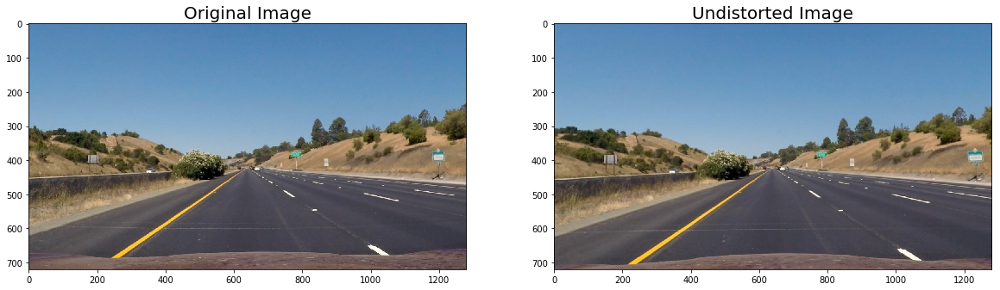

In [3]:
#reading in an image
import cv2

image = cv2.imread('test_images/straight_lines1.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
dst = cv2.undistort(image, mtx, dist, None, mtx)


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=20)
plt.show()

## Define Perspective Transform

In [4]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, src=None, dst=None, disp=True):

    # Grab the image shape
    img_size = (img.shape[1], img.shape[0])
    offset = 200
    warpedImgSize = (500, 1500)
    
    if src == None:
        src = np.float32([
            [512, 480],
            [766, 480],
            [1165, 670],
            [100, 670]])
        
    if dst == None:

        dst = np.float32(
                    [[offset, 0], 
                    [img_size[0] - offset, 0], 
                    [img_size[0] - offset, img_size[1]], 
                    [offset, img_size[1]]])
    
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)

 
    corner_tuples=[]
    for ind,c in enumerate(src):
        corner_tuples.append(tuple(src[ind]))

    dst_img = img.copy()
    cv2.line(dst_img, corner_tuples[0], corner_tuples[1], color=[255,0,0], thickness=3)
    cv2.line(dst_img, corner_tuples[1], corner_tuples[2], color=[255,0,0], thickness=3)
    cv2.line(dst_img, corner_tuples[2], corner_tuples[3], color=[255,0,0], thickness=3)
    cv2.line(dst_img, corner_tuples[3], corner_tuples[0], color=[255,0,0], thickness=3)
    #disp_img = cv2.polylines(img,[src],True,(0,255,255))
   
    
    if disp:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(dst_img)
        ax1.set_title('Original Image', fontsize=20)
        ax2.imshow(warped)
        ax2.set_title('Unwarped Image', fontsize=20)
        plt.show()    
    
    # Return the resulting image and matrix
    return warped, dst_img, M, Minv

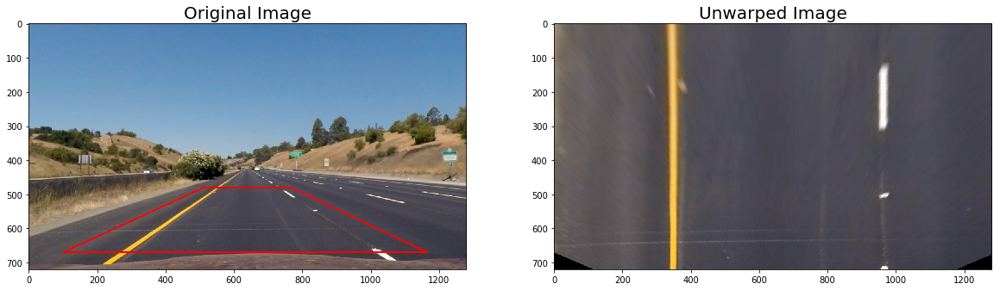

In [5]:
warped, dst_img, M, Minv = corners_unwarp(dst)

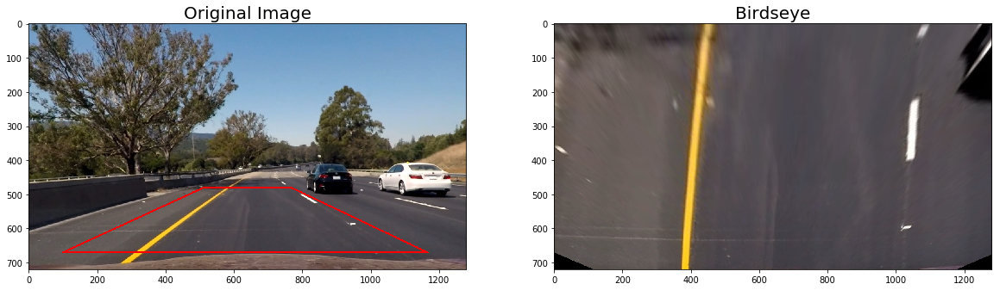

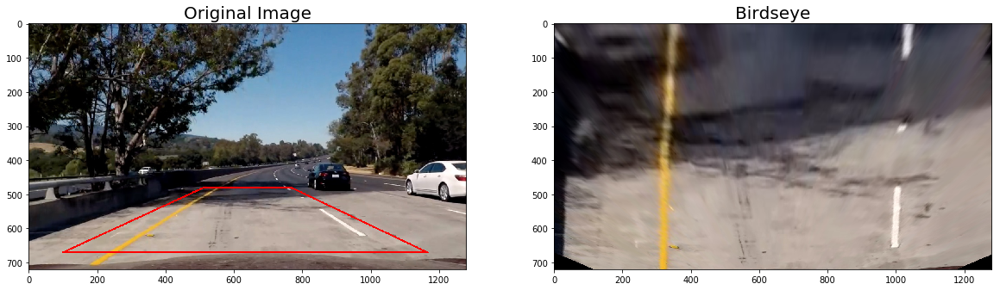

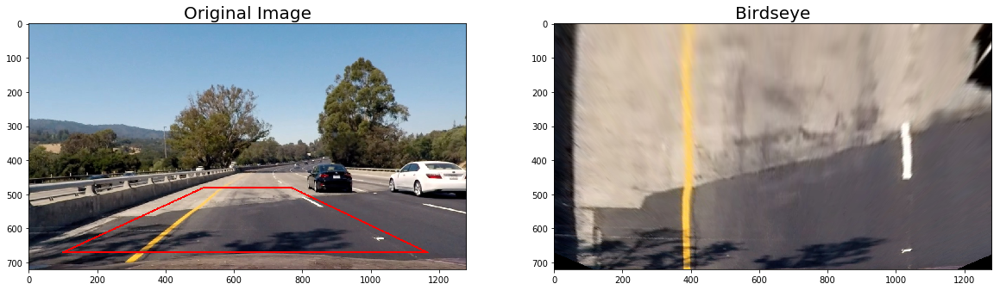

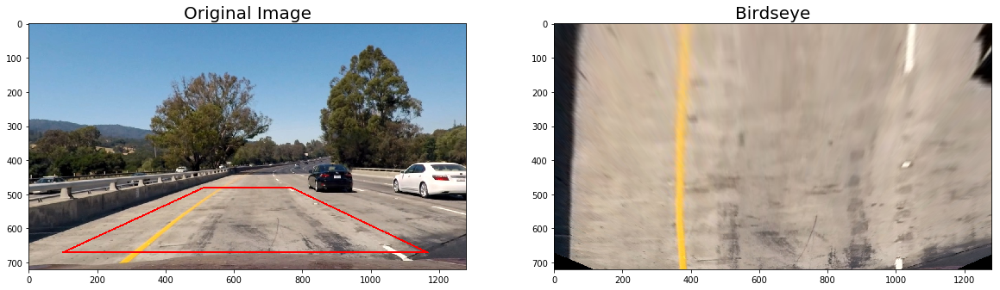

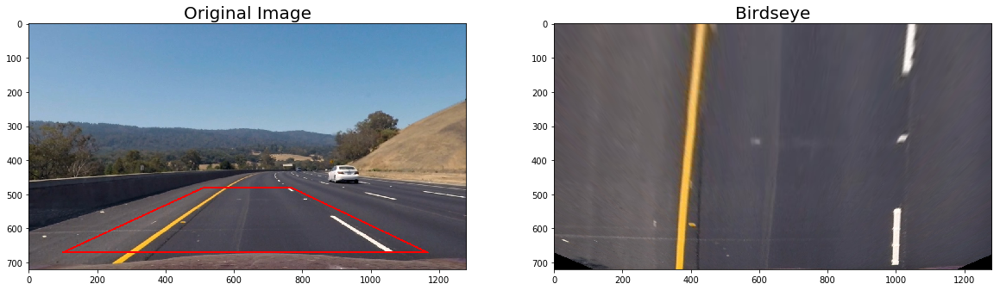

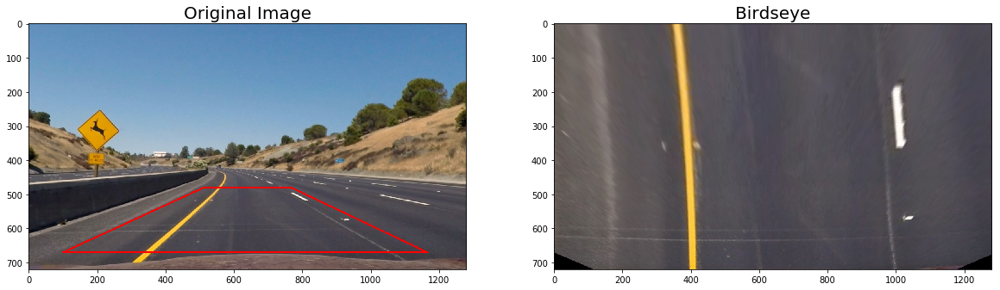

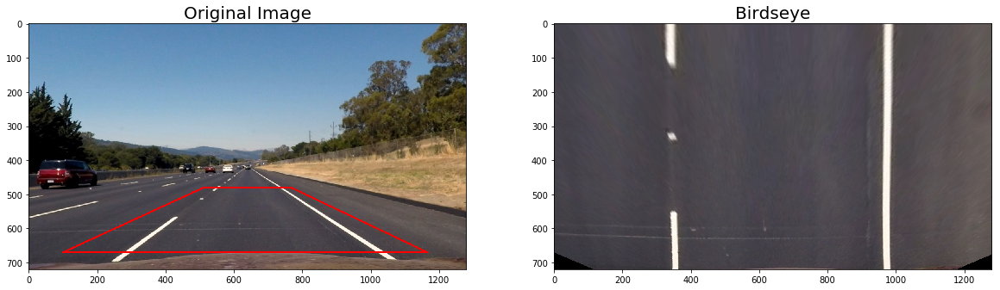

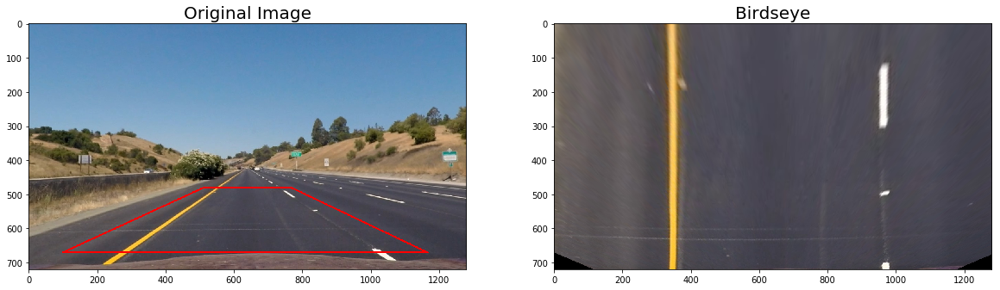

In [6]:
# TODO: Build your pipeline that will draw lane lines on the test_images
# then save them to the test_images directory.
import os 

for filename in os.listdir("test_images/"):
    image = cv2.imread((os.path.join("test_images/", filename)))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    dst = cv2.undistort(image, mtx, dist, None, mtx)

    warped, dst_img, M, Minv = corners_unwarp(dst, None, None, False)
    
    warpedviz = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]))
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(dst_img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(warpedviz)
    ax2.set_title('Birdseye', fontsize=20)
    plt.show()      

In [7]:
def view_rgb(img):
    r_channel = img[:,:,0]
    g_channel = img[:,:,1]
    b_channel = img[:,:,2]
    
    f, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, figsize=(20,10))
    ax0.imshow(img)
    ax0.set_title('Raw', fontsize=20)    
    ax1.imshow(r_channel, cmap='gray')
    ax1.set_title('R', fontsize=20)
    ax2.imshow(g_channel, cmap='gray')
    ax2.set_title('G', fontsize=20)
    ax3.imshow(b_channel, cmap='gray')
    ax3.set_title('B', fontsize=20)    
    plt.show()

def view_hls(img):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    f, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, figsize=(20,10))
    ax0.imshow(img)
    ax0.set_title('Raw', fontsize=20)    
    ax1.imshow(h_channel, cmap='gray')
    ax1.set_title('H', fontsize=20)
    ax2.imshow(l_channel, cmap='gray')
    ax2.set_title('L', fontsize=20)
    ax3.imshow(s_channel, cmap='gray')
    ax3.set_title('S', fontsize=20)    
    plt.show()

def view_hsv(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float)
    h_channel = hsv[:,:,0]
    s_channel = hsv[:,:,1]
    v_channel = hsv[:,:,2]
    
    f, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, figsize=(20,10))
    ax0.imshow(img)
    ax0.set_title('Raw', fontsize=20)  
    ax1.imshow(h_channel, cmap='gray')
    ax1.set_title('H', fontsize=20)
    ax2.imshow(s_channel, cmap='gray')
    ax2.set_title('S', fontsize=20)
    ax3.imshow(v_channel, cmap='gray')
    ax3.set_title('V', fontsize=20)    
    plt.show()  
    
def view_lab(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB).astype(np.float)
    l_channel = lab[:,:,0]
    a_channel = lab[:,:,1]
    b_channel = lab[:,:,2]
    
    f, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, figsize=(20,10))
    ax0.imshow(img)
    ax0.set_title('Raw', fontsize=20)  
    ax1.imshow(l_channel, cmap='gray')
    ax1.set_title('L', fontsize=20)
    ax2.imshow(a_channel, cmap='gray')
    ax2.set_title('A', fontsize=20)
    ax3.imshow(b_channel, cmap='gray')
    ax3.set_title('B', fontsize=20)    
    plt.show()  
    
def view_luv(img):
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2LUV).astype(np.float)
    l_channel = luv[:,:,0]
    u_channel = luv[:,:,1]
    v_channel = luv[:,:,2]
    
    f, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, figsize=(20,10))
    ax0.imshow(img)
    ax0.set_title('Raw', fontsize=20)  
    ax1.imshow(l_channel, cmap='gray')
    ax1.set_title('L', fontsize=20)
    ax2.imshow(u_channel, cmap='gray')
    ax2.set_title('U', fontsize=20)
    ax3.imshow(v_channel, cmap='gray')
    ax3.set_title('V', fontsize=20)    
    plt.show()  

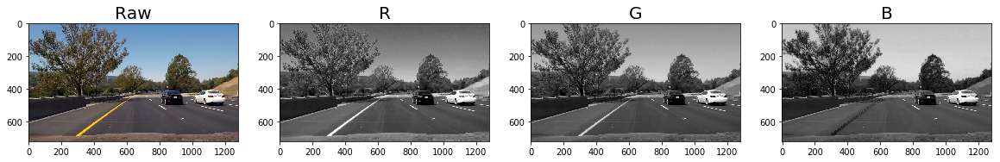

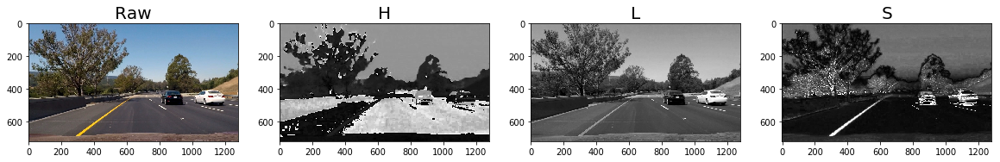

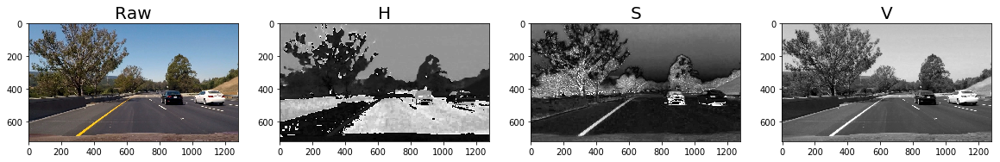

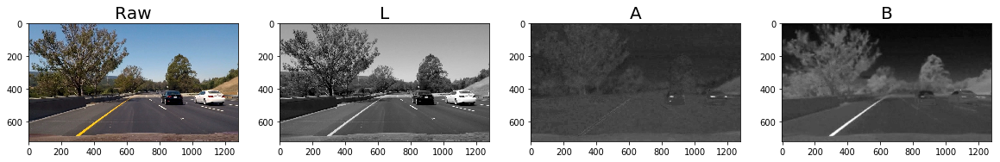

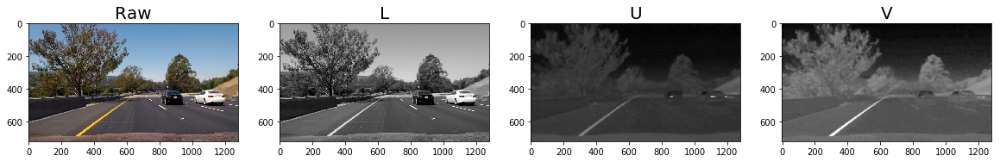

...

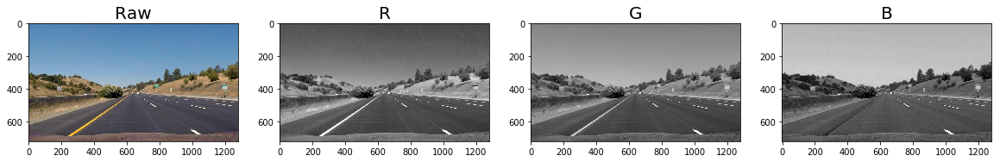

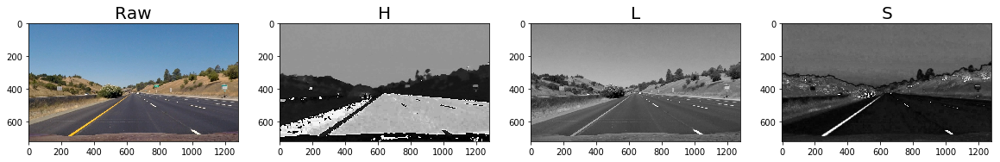

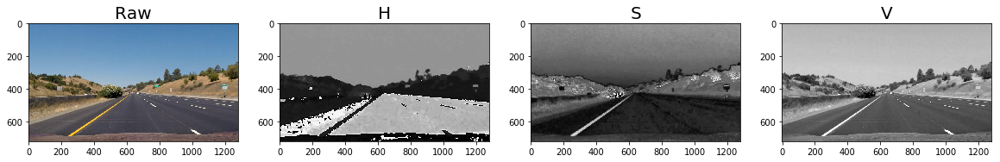

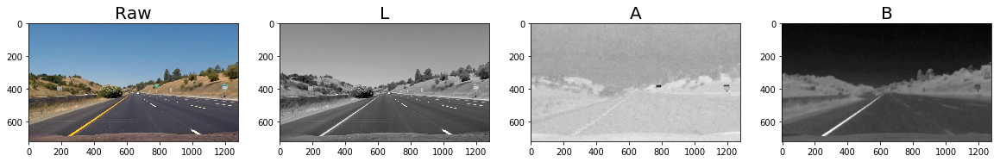

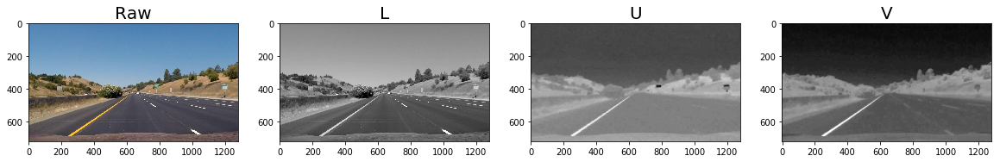

In [8]:
for filename in os.listdir("test_images/"):
    image = cv2.imread(os.path.join("test_images/", filename))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    view_rgb(image)
    view_hls(image)
    view_hsv(image)
    view_lab(image)
    view_luv(image)

## Helper Functions

Below are some helper functions to help get you started. They should look familiar from the lesson!

In [9]:
import math

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def laplacian_tresholding(img):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    gray = (0.5*img[:,:,0] + 0.4*img[:,:,1] + 0.1*img[:,:,2]).astype(np.uint8)

    total_px = img.shape[0]*img.shape[1]
    laplacian = cv2.Laplacian(gray, cv2.CV_32F, ksize=21)
    masked_image = (laplacian < 0.15*np.min(laplacian)).astype(np.uint8)
    if cv2.countNonZero(masked_image)/total_px < 0.01:
        laplacian = cv2.Laplacian(gray, cv2.CV_32F, ksize=21)
        masked_image = (laplacian < 0.075*np.min(laplacian)).astype(np.uint8)
        masked_image = masked_image * 255


    return masked_image

def combined_color_thresholding(img):
    
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    img_luv = cv2.cvtColor(img, cv2.COLOR_RGB2Luv)
    
    img_rgb_r = img[:,:,0]
    img_hsv_v = img_hsv[:,:,2]
    img_luv_v = img_luv[:,:,2]
    
    _, bin_rgb_ch1 = cv2.threshold(img_rgb_r.astype(np.uint8),230,255,cv2.THRESH_BINARY)
    _, bin_hsv_ch3 = cv2.threshold(img_hsv_v.astype(np.uint8),230,255,cv2.THRESH_BINARY)
    _, bin_luv_ch3 = cv2.threshold(img_luv_v.astype(np.uint8),157,255,cv2.THRESH_BINARY)
    
    binary = np.zeros_like(bin_rgb_ch1)
    binary[
        (bin_rgb_ch1 == 255)
        | (bin_hsv_ch3 == 255)
        | (bin_luv_ch3 == 255)
        ] = 255
    
    return binary

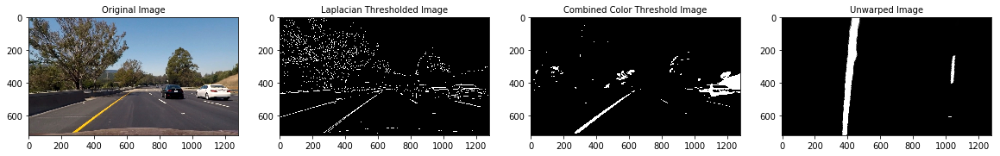

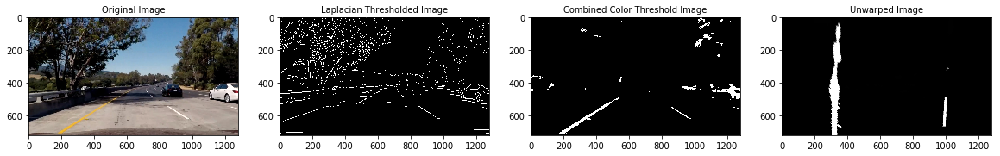

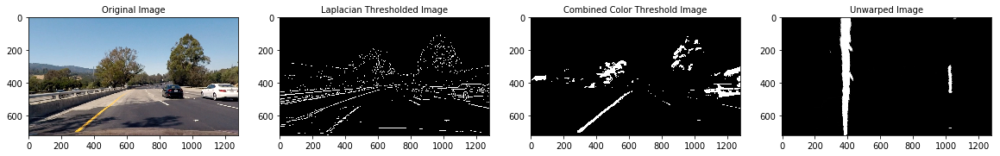

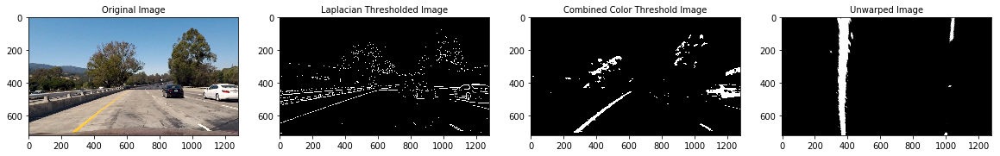

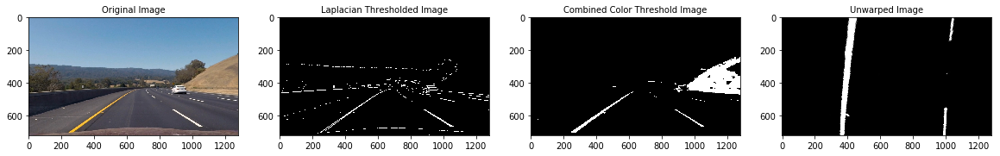

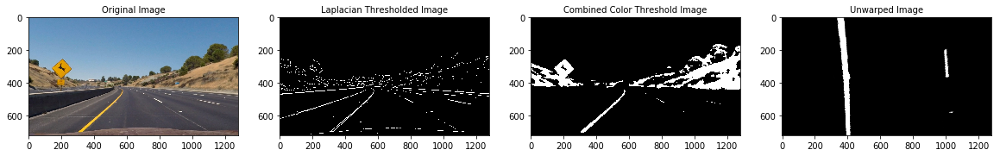

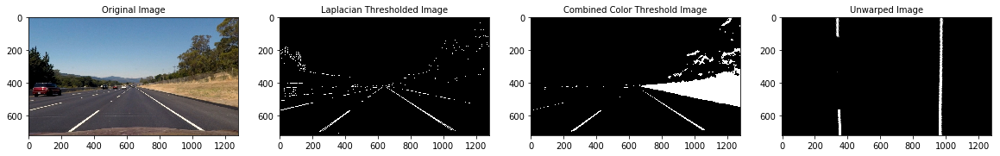

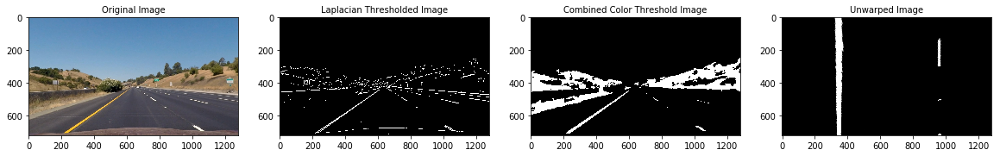

In [10]:
for filename in os.listdir("test_images/"):
    image = cv2.imread(os.path.join("test_images/", filename))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    dst = cv2.undistort(image, mtx, dist, None, mtx)
    imshape = image.shape
    

    combined_mask_1 = laplacian_tresholding(dst)
    combined_mask_2 = combined_color_thresholding(dst)
    combined_mask = cv2.bitwise_or(combined_mask_1, combined_mask_2)
    
    src = np.array([[
        (512, 480),
        (766, 480),
        (1165, 670),
        (100, 670)]], dtype=np.int32)
    
    combined_mask = region_of_interest(combined_mask, src)
    
    warped, dist_img, M, Minv = corners_unwarp(combined_mask, None, None, False)
    warpedviz = cv2.warpPerspective(combined_mask, M, (combined_mask.shape[1], combined_mask.shape[0]))        
    
    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,10))
    ax1.imshow(dst)
    ax1.set_title('Original Image', fontsize=10)
    ax2.imshow(combined_mask_1, cmap='gray')
    ax2.set_title('Laplacian Thresholded Image', fontsize=10)
    ax3.imshow(combined_mask_2, cmap='gray' )
    ax3.set_title('Combined Color Threshold Image', fontsize=10)
    ax4.imshow(warped, cmap='gray')
    ax4.set_title('Unwarped Image', fontsize=10)    
    plt.show()        
    

In [11]:
import numpy as np
import cv2
import matplotlib.pyplot as plt


def find_lines( raw_image, binary_warped, disp=True ):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
 
    #----------Radius of curvature calculation---------------
    y_eval = np.max(ploty)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.0/72.0 # meters per pixel in y dimension
    xm_per_pix = 3.7/400 # meters per pixel in x dimension
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')    
  
    #Calculate position of car w.r.t. lane's center. Assumed that car position is center of image
    midx = image.shape[1]//2
    x_left_pix = left_fit[0]*(y_eval**2) + left_fit[1]*y_eval + left_fit[2]
    x_right_pix = right_fit[0]*(y_eval**2) + right_fit[1]*y_eval + right_fit[2]
    position_from_center = ((x_left_pix + x_right_pix)/2 - midx) * xm_per_pix


    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    

    if disp:
        f, (ax1, ax2 ) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(raw_image)
        ax1.set_title('Original Image', fontsize=20)

        ax2.imshow(out_img)
        ax2.plot(left_fitx, ploty, color='yellow')
        ax2.plot(right_fitx, ploty, color='yellow')
        #ax2.xlim(0, 1280)
        #ax2.ylim(720, 0)   

        plt.show()        

    return out_img, left_fitx, right_fitx, ploty, left_curverad, right_curverad, position_from_center

In [12]:
# Create an image to draw the lines on
def draw_detected_lines(image, Minv, left_fitx, right_fitx, ploty ):
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    return result

In [13]:
def overlay_curvature_info(image, left_curverad, right_curverad, position_from_center):
  
    font = cv2.FONT_HERSHEY_SIMPLEX
    result = image.copy()
    cv2.putText(result,'Left RoC  = %2.2f km'%(left_curverad/1000.),(50,50), font, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(result,'Right RoC = %2.2f km'%(right_curverad/1000.),(50,80), font, 1,(255,255,255),2,cv2.LINE_AA)
    
    if position_from_center < 0:
        text = 'left'
    else:
        text = 'right'
    cv2.putText(result,'Distance From Center: %3.2f cm %s' % (np.absolute(position_from_center*100), text),(20,110), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
    
    return result

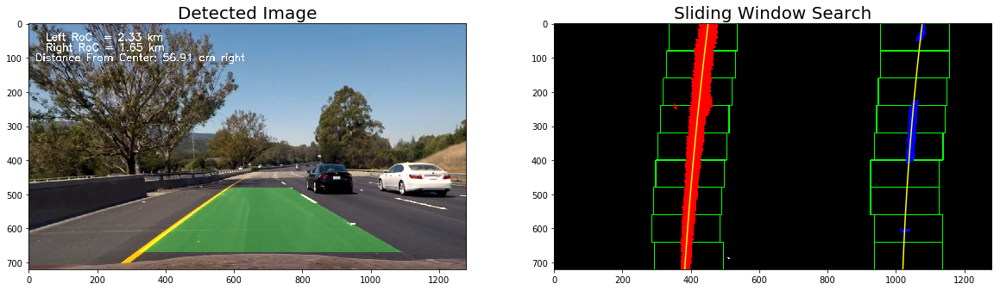

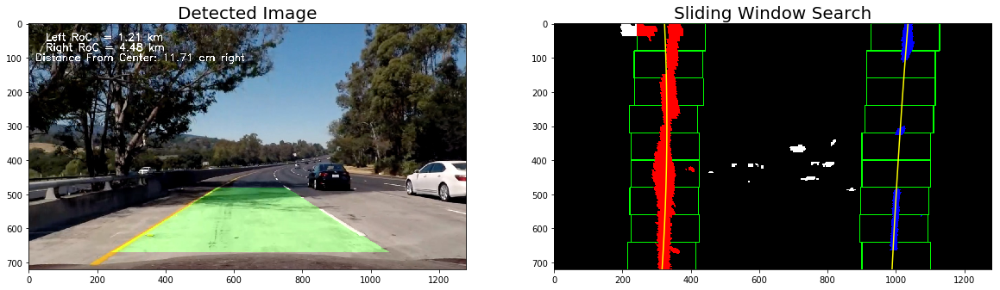

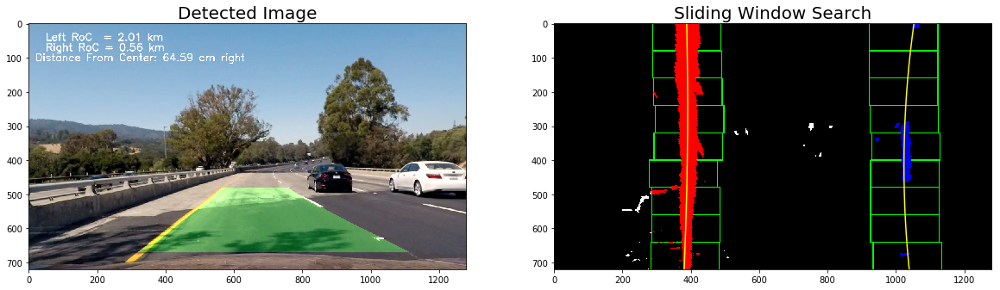

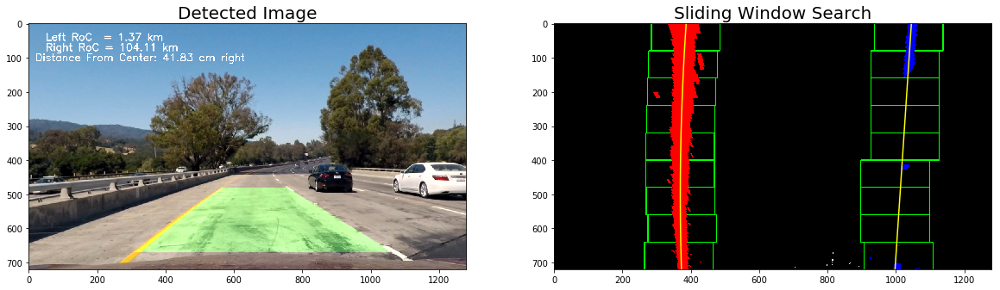

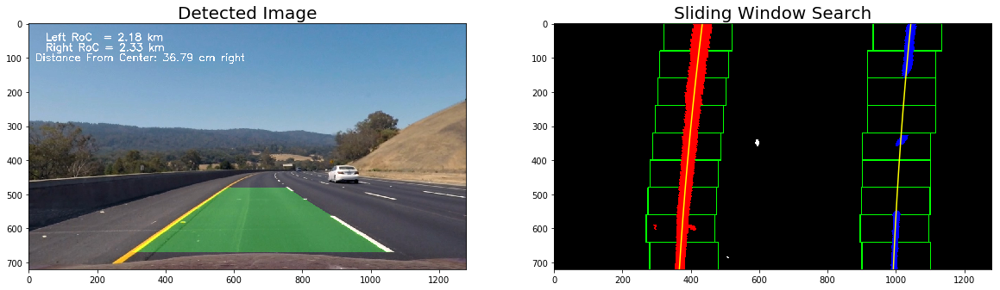

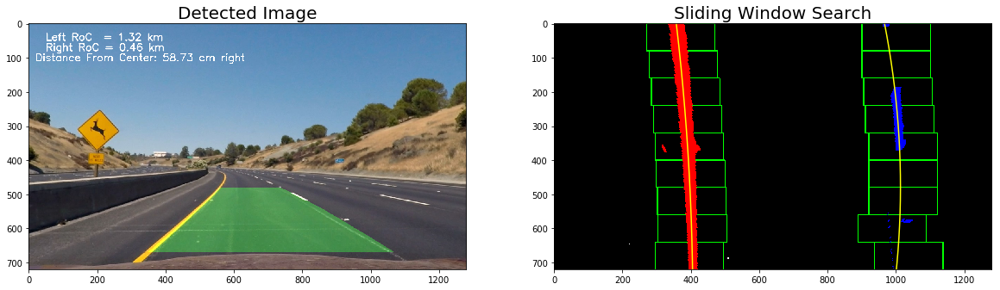

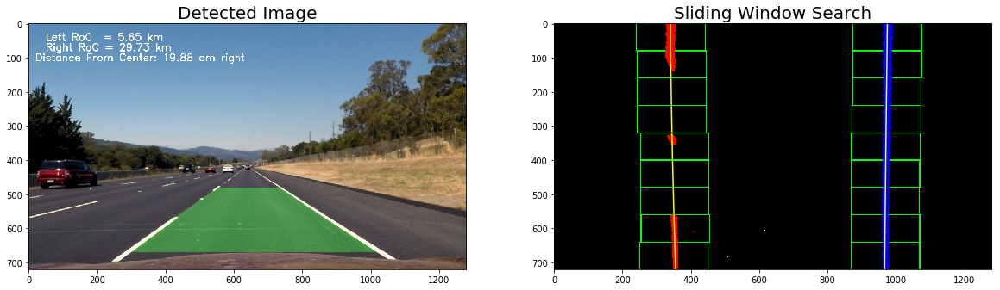

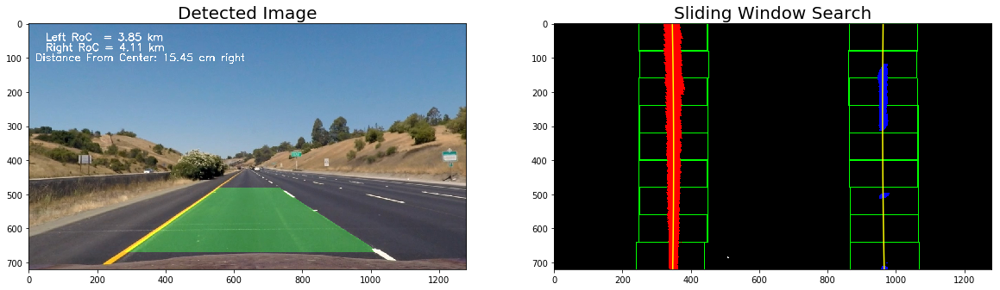

In [14]:
for filename in os.listdir("test_images/"):
    image = cv2.imread(os.path.join("test_images/", filename))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    dst = cv2.undistort(image, mtx, dist, None, mtx)
    imshape = image.shape
    
    combined_mask_1 = laplacian_tresholding(dst)
    combined_mask_2 = combined_color_thresholding(dst)
    combined_mask = cv2.bitwise_or(combined_mask_1, combined_mask_2)
    
    src = np.array([[
        (512, 480),
        (766, 480),
        (1165, 670),
        (100, 670)]], dtype=np.int32)
    
    combined_mask = region_of_interest(combined_mask, src)
    

    warped, dst_img, M, Minv = corners_unwarp(combined_mask, None, None, False)
    warpedviz = cv2.warpPerspective(combined_mask, M, (combined_mask.shape[1], combined_mask.shape[0]))
    
    #print( warped.shape[0] )
    traced, left_fitx, right_fitx, ploty, left_curverad, right_curverad, position_from_center = find_lines( dst, warped, False )
    
 
    
    detected_img = draw_detected_lines(dst, Minv, left_fitx, right_fitx, ploty )
    detected_img = overlay_curvature_info(detected_img, left_curverad, right_curverad, position_from_center)


    
    filename_base = "sliding_window_"  + filename.replace("/", "")
    mpimg.imsave(os.path.join("output/", filename_base), traced)
    filename_base = "final_"  + filename.replace("/", "")
    mpimg.imsave(os.path.join("output/", filename_base), detected_img)
    
    f, (ax1, ax2 ) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(detected_img)
    ax1.set_title('Detected Image', fontsize=20)

    ax2.imshow(traced)
    ax2.plot(left_fitx, ploty, color='yellow')
    ax2.plot(right_fitx, ploty, color='yellow')
    ax2.set_title('Sliding Window Search', fontsize=20)

    plt.show() 

## Build a Lane Finding Pipeline



Build the pipeline and run your solution on all test_images. Make copies into the `test_images_output` directory, and you can use the images in your writeup report.

Try tuning the various parameters, especially the low and high Canny thresholds as well as the Hough lines parameters.

In [15]:
def process_image(image):

    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    dst = cv2.undistort(image, mtx, dist, None, mtx)
    imshape = image.shape
      
    combined_mask_1 = laplacian_tresholding(dst)
    combined_mask_2 = combined_color_thresholding(dst)
    combined_mask = cv2.bitwise_or(combined_mask_1, combined_mask_2)  
    
    src = np.array([[
        (512, 480),
        (766, 480),
        (1165, 670),
        (100, 670)]], dtype=np.int32)
    
    combined_mask_roi = region_of_interest(combined_mask, src)    
    
    _, dst_img, _, _ = corners_unwarp(dst, None, None, False)
    warped, _, M, Minv = corners_unwarp(combined_mask_roi, None, None, False)
    warpedviz = cv2.warpPerspective(combined_mask_roi, M, (combined_mask_roi.shape[1], combined_mask_roi.shape[0]))
    
    traced, left_fitx, right_fitx, ploty, left_curverad, right_curverad, position_from_center = find_lines( dst, warped, False )
        
    detected_img = draw_detected_lines(dst_img, Minv, left_fitx, right_fitx, ploty )
    detected_img = overlay_curvature_info(detected_img, left_curverad, right_curverad, position_from_center)
    
    result = np.zeros((imshape[0]*2,imshape[1]*2,3), np.uint8)
    
    width2x = imshape[1]*2
    height2x = imshape[0]*2
    
    result[0:imshape[0],0:imshape[1]] = image
    result[imshape[0]:height2x, 0:imshape[1]] = cv2.cvtColor(combined_mask, cv2.COLOR_GRAY2RGB)
    result[0:imshape[0], imshape[1]:width2x] = traced
    result[imshape[0]:height2x, imshape[1]:width2x] = detected_img
    
    return result

## Test on Videos

In [16]:
import imageio
imageio.plugins.ffmpeg.download()

In [17]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

Let's try the one with the solid white lane on the right first ...

In [18]:
video_output = 'output/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("test_video/project_video.mp4")
video_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video output/project_video.mp4
[MoviePy] Writing video output/project_video.mp4


100%|█████████▉| 1260/1261 [05:09<00:00,  4.05it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output/project_video.mp4 

CPU times: user 8min 27s, sys: 1min 8s, total: 9min 35s
Wall time: 5min 13s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [19]:
video_output = 'output/project_video.mp4'
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))